# Employee turnover prediction 


In [1]:
import numpy as np
import pandas as pd
import matplotlib as mlp
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
import statistics
import warnings    # We want to suppress warnings
import os


import scipy.stats as stats

from sklearn.preprocessing import LabelEncoder, OneHotEncoder, StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.manifold import TSNE
from sklearn.decomposition import TruncatedSVD, PCA
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import AdaBoostClassifier, RandomForestClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier

from sklearn.model_selection import cross_val_score, StratifiedKFold, GridSearchCV, cross_val_predict
from sklearn.metrics import (roc_curve, roc_auc_score, precision_recall_curve, classification_report, average_precision_score,
                            PrecisionRecallDisplay)     

from sklearn.metrics import PrecisionRecallDisplay

from sklearn.metrics import confusion_matrix

In [2]:
#warnings.filterwarnings("ignore")    # Ignore warnings

In [3]:
#pip install lightgbm

In [4]:
#conda install -f scipy

### IBM HR data

We are using IBM HR dataset (improved version)
https://www.kaggle.com/datasets/dgokeeffe/ibm-hr-wmore-rows

Uncover the strongest factors correlation thatlead to employee attrition we used an adjusted version with 32 features,
we did not use the added rows just the added features.

In [5]:
hrdata = pd.read_csv("hrdata.csv")
hrdata.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,...,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,EmployeeSource
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,2,Female,...,1,0,8,0,1,6,4,0,5,Referral
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,3,Male,...,4,1,10,3,3,10,7,1,7,Referral
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,4,Male,...,2,0,7,3,3,0,0,0,0,Referral
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,4,Female,...,3,0,8,3,3,8,7,3,0,Referral
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,Male,...,4,1,6,3,3,2,2,2,2,Referral


In [6]:
hrdata['Attrition'].value_counts()

No     1233
Yes     237
Name: Attrition, dtype: int64

Imbalanced data 1233 no attrition versus 237 attrition.

In [7]:
Nunique = hrdata.nunique()
Nunique = Nunique.sort_values()
Nunique

OverTime                       2
Attrition                      2
Gender                         2
PerformanceRating              2
MaritalStatus                  3
BusinessTravel                 3
Department                     3
WorkLifeBalance                4
StockOptionLevel               4
JobInvolvement                 4
RelationshipSatisfaction       4
JobSatisfaction                4
EnvironmentSatisfaction        4
Education                      5
JobLevel                       5
EducationField                 6
TrainingTimesLastYear          7
EmployeeSource                 9
JobRole                        9
NumCompaniesWorked            10
PercentSalaryHike             15
YearsSinceLastPromotion       16
YearsWithCurrManager          18
YearsInCurrentRole            19
DistanceFromHome              29
YearsAtCompany                37
TotalWorkingYears             40
Age                           43
HourlyRate                    71
DailyRate                    886
MonthlyInc

# Data visualization and cleaning 

C:\Users\mede1\Anaconda3\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
C:\Users\mede1\Anaconda3\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
C:\Users\mede1\Anaconda3\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
C:\Users\mede1\Anaconda3\lib\site-

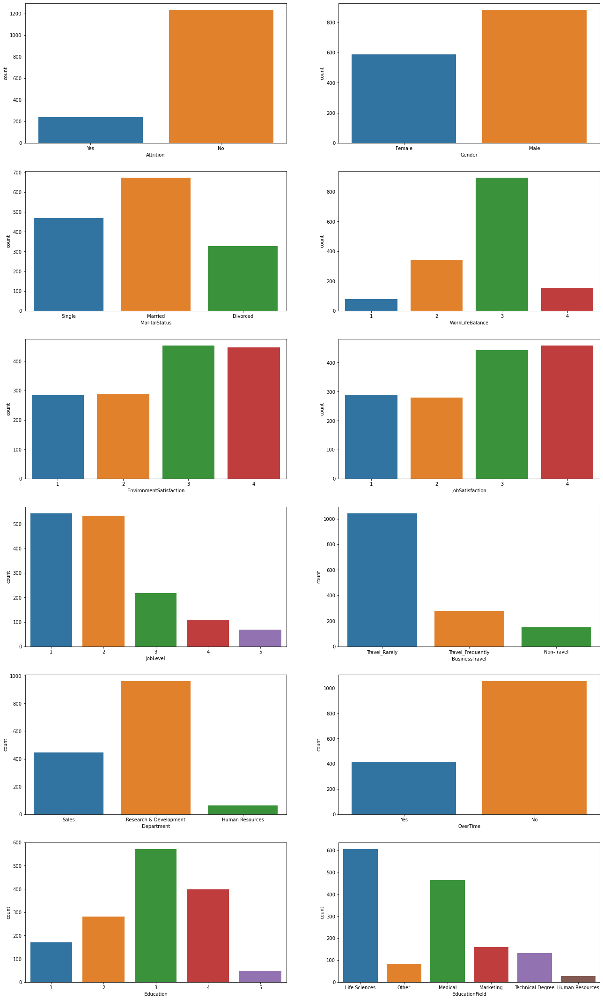

In [8]:
#Distribution of data per gender, attirition..(each categorical features), total count of variables per each category 
total_records = len(hrdata)
columns = ["Attrition","Gender","MaritalStatus","WorkLifeBalance","EnvironmentSatisfaction","JobSatisfaction",
           "JobLevel","BusinessTravel","Department","OverTime","Education","EducationField"]
plt.figure(figsize=(22,10))
j=0
for i in columns:
    j +=1
    plt.subplot(6,2,j)
    sns.countplot(hrdata[i])
plt.subplots_adjust(bottom=-0.9, top=2)
#plt.show()

C:\Users\mede1\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\mede1\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\mede1\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-lev

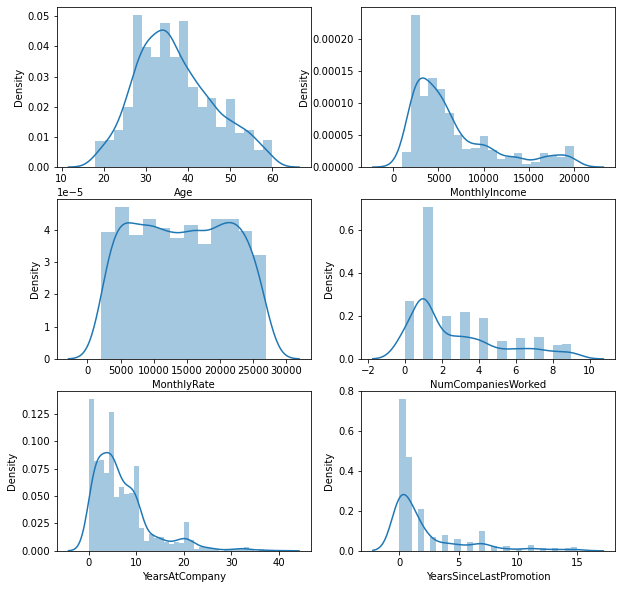

In [9]:
fig,ax = plt.subplots(3,2, figsize=(10,10))               
sns.distplot(hrdata['Age'], ax = ax[0,0]) 
sns.distplot(hrdata['MonthlyIncome'], ax = ax[0,1]) 
sns.distplot(hrdata['MonthlyRate'], ax = ax[1,0]) 
sns.distplot(hrdata['NumCompaniesWorked'], ax = ax[1,1]) 
sns.distplot(hrdata['YearsAtCompany'], ax = ax[2,0]) 
sns.distplot(hrdata['YearsSinceLastPromotion'], ax = ax[2,1]) 
#sns.distplot(hrdata['DailyRate'], ax = ax[1,1]) 
plt.show()

C:\Users\mede1\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\mede1\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\mede1\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-lev

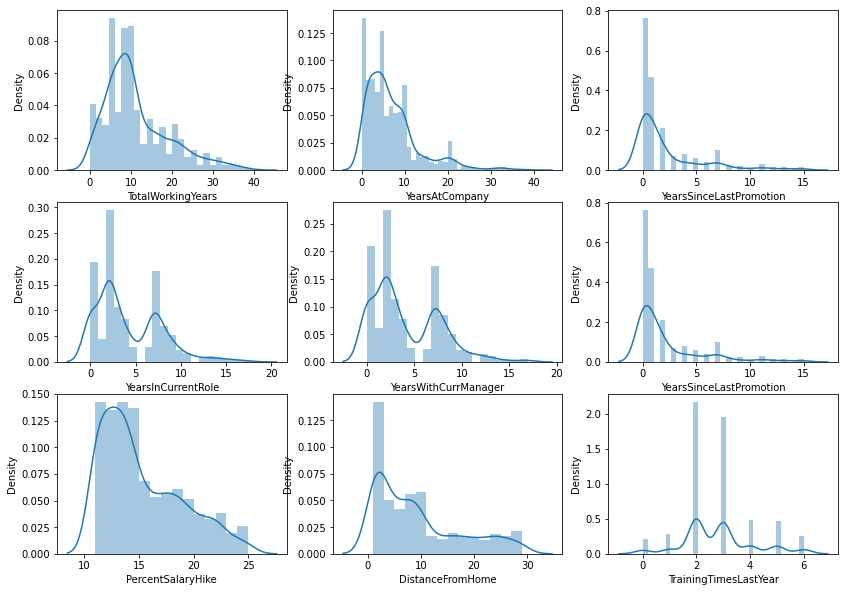

In [10]:
fig,ax = plt.subplots(3,3, figsize=(14,10))  
#seniority in the company and in genral 
sns.distplot(hrdata['TotalWorkingYears'], ax = ax[0,0]) 
sns.distplot(hrdata['YearsAtCompany'], ax = ax[0,1]) 
sns.distplot(hrdata['YearsSinceLastPromotion'], ax = ax[0,2]) 
sns.distplot(hrdata['YearsInCurrentRole'], ax = ax[1,0]) 
sns.distplot(hrdata['YearsWithCurrManager'], ax = ax[1,1]) 
sns.distplot(hrdata['YearsSinceLastPromotion'], ax = ax[1,2]) 
sns.distplot(hrdata['PercentSalaryHike'], ax = ax[2,0]) 
sns.distplot(hrdata['DistanceFromHome'], ax = ax[2,1]) 
sns.distplot(hrdata['TrainingTimesLastYear'], ax = ax[2,2]) 
plt.show()

In [11]:
print(hrdata.Department.unique())
print(hrdata.BusinessTravel.unique())
print(hrdata.EducationField.unique())
print(hrdata.Gender.unique())
print(hrdata.JobRole.unique())
print(hrdata.MaritalStatus.unique())
print(hrdata.Attrition.unique())
print(hrdata.EmployeeSource.unique())

['Sales' 'Research & Development' 'Human Resources']
['Travel_Rarely' 'Travel_Frequently' 'Non-Travel']
['Life Sciences' 'Other' 'Medical' 'Marketing' 'Technical Degree'
 'Human Resources']
['Female' 'Male']
['Sales Executive' 'Research Scientist' 'Laboratory Technician'
 'Manufacturing Director' 'Healthcare Representative' 'Manager'
 'Sales Representative' 'Research Director' 'Human Resources']
['Single' 'Married' 'Divorced']
['Yes' 'No']
['Referral' 'Company Website' 'Indeed' 'Seek' 'Adzuna' 'Recruit.net'
 'GlassDoor' 'Jora' 'LinkedIn']


In [12]:
def qr_outliers(col):
    outliers = []
    
    q1 = col.quantile(0.25)
    q3 = col.quantile(0.75)
    inter_qr = q3 - q1
    lower_limit = q1 - 1.5 * inter_qr
    upper_limit = q3 + 1.5 * inter_qr
    for val in col:
        if val > upper_limit or val < lower_limit:
            outliers.append(val)
    return outliers

In [13]:
col_outliers = []
for col in hrdata.columns:
    if hrdata[col].dtype == 'O' : continue
    else : 
        outliers = qr_outliers(hrdata[col])
        if outliers != []:
            col_outliers.append(col)
            print(col,':' ,outliers)

MonthlyIncome : [19094, 18947, 19545, 18740, 18844, 18172, 17328, 16959, 19537, 17181, 19926, 19033, 18722, 19999, 16792, 19232, 19517, 19068, 19202, 19436, 16872, 19045, 19144, 17584, 18665, 17068, 19272, 18300, 16659, 19406, 19197, 19566, 18041, 17046, 17861, 16835, 16595, 19502, 18200, 16627, 19513, 19141, 19189, 16856, 19859, 18430, 17639, 16752, 19246, 17159, 17924, 17099, 17444, 17399, 19419, 18303, 19973, 19845, 17650, 19237, 19627, 16756, 17665, 16885, 17465, 19626, 19943, 18606, 17048, 17856, 19081, 17779, 19740, 18711, 18265, 18213, 18824, 18789, 19847, 19190, 18061, 17123, 16880, 17861, 19187, 19717, 16799, 17328, 19701, 17169, 16598, 17007, 16606, 19586, 19331, 19613, 17567, 19049, 19658, 17426, 17603, 16704, 19833, 19038, 19328, 19392, 19665, 16823, 17174, 17875, 19161, 19636, 19431, 18880]
NumCompaniesWorked : [9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9]
Perform

Since we have different solutions for handling constant columns (NumCompaniesWorked,PerformanceRating and StockOptionLevel) versus columns with different outliers, we seperate these two. We store the constant columns i
n constant_cols and keep the different outlier columns in col_outliers. More details can be found in the follwing link https://www.kaggle.com/oceands/hr-analytics-binary-classification-for-attrition


In [14]:
print('NumCompaniesWorked:', hrdata.NumCompaniesWorked.unique())
print('PerformanceRating:', hrdata.PerformanceRating.unique())
print('StockOptionLevel:', hrdata.StockOptionLevel.unique())

NumCompaniesWorked: [8 1 6 9 0 4 5 2 7 3]
PerformanceRating: [3 4]
StockOptionLevel: [0 1 3 2]


In [15]:
constant_cols = col_outliers[1:4] # detecting constants 
col_outliers[1:4] = []# dropping constants
col_outliers

['MonthlyIncome',
 'TotalWorkingYears',
 'TrainingTimesLastYear',
 'YearsAtCompany',
 'YearsInCurrentRole',
 'YearsSinceLastPromotion',
 'YearsWithCurrManager']

Based on the box plots on the right the detected outliers are removed.

In [16]:
def box_plot_outliers(cols, hrdata):
    fig, ax = plt.subplots(7,2, figsize = (8, 15))
    
    i = 0
    j = 0
    for col in cols:
        #print(col)
        sns.boxplot(hrdata[col], ax = ax[i, j])

        ax[i, j].tick_params(axis = 'both', which = 'major', labelsize = 8)
        ax[i, j].set_xlabel('')
        ax[i, j].set_ylabel(col)
        j += 1

        hrdata.loc[hrdata[col] > 0, col], fitted_lambda = stats.boxcox(hrdata[hrdata[col] > 0][col], lmbda = None)
        sns.boxplot(hrdata[col], ax = ax[i, j], color = '#FF0000')
        ax[i, j].tick_params(axis = 'both', which = 'major', labelsize = 8)
        ax[i, j].set_xlabel('')
        i += 1
        j -= 1
        
    fig.suptitle('Before [left] and After [Right] BoxCox Transformation for Removing Outliers ', fontsize = 12)
    fig.subplots_adjust(top = 0.98)
    fig.tight_layout() #Padding between the figure edge and the edges of subplots, as a fraction of the font size.
    
    plt.show()

C:\Users\mede1\Anaconda3\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
C:\Users\mede1\Anaconda3\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
C:\Users\mede1\Anaconda3\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
C:\Users\mede1\Anaconda3\lib\site-

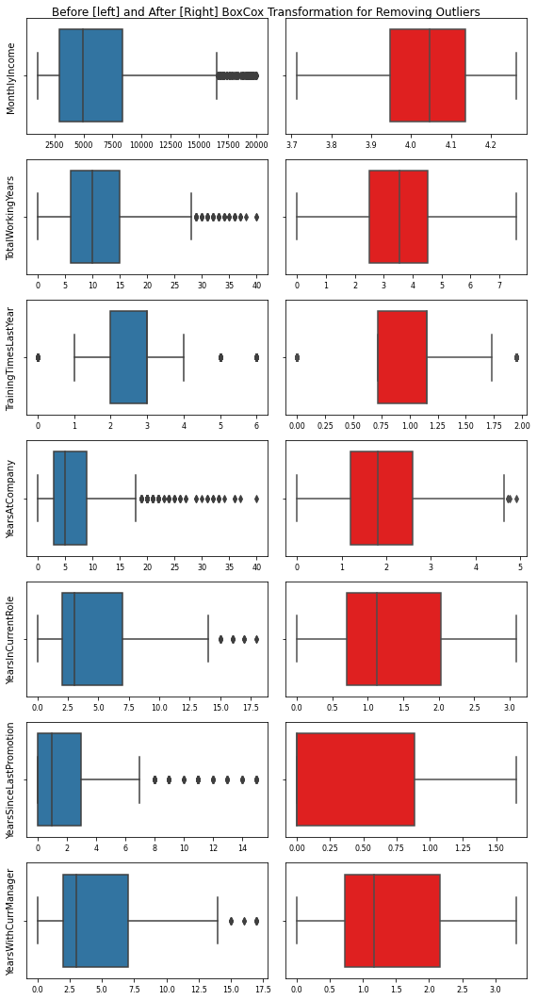

In [17]:
box_plot_outliers(col_outliers, hrdata)

In [18]:
def constant_cols_outliers(cols, hrdata):
    fig, ax = plt.subplots(3,2, figsize = (8, 5))
    
    i = 0
    j = 0
    for col in cols:
        #print(col)
        
        sns.distplot(hrdata[col], ax = ax[i, j])
        ax[i, j].tick_params(axis = 'both', which = 'major', labelsize = 8)
        ax[i, j].set_xlabel('')
        ax[i, j].set_ylabel(col)
        j += 1
        
        if col == 'NumCompaniesWorked':
            hrdata.loc[hrdata[col] == 9, col] = np.mean(hrdata[col])
        elif col == 'PerformanceRating':
            hrdata.loc[hrdata[col] == 4, col] = np.mean(hrdata[col])
        else:
            hrdata.loc[hrdata[col] == 3, col] = np.mean(hrdata[col])
        
        sns.distplot(hrdata[col], ax = ax[i, j], color = 'r')
        ax[i, j].tick_params(axis = 'both', which = 'major', labelsize = 8)
        ax[i, j].set_xlabel('')
        i += 1
        j -= 1
        
    fig.suptitle('Before [left] and After [Right] mean imputation for Removing Constant value Outliers ', fontsize = 12)
    fig.subplots_adjust(top = 0.98)
    fig.tight_layout()
    
    plt.show()

C:\Users\mede1\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\mede1\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\mede1\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-lev

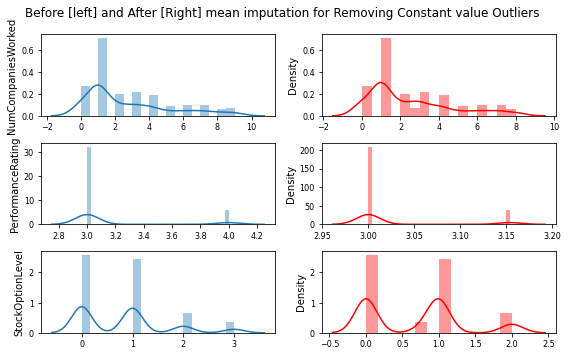

In [19]:
constant_cols_outliers(constant_cols, hrdata)

## Preprocessing and Encoding Categorical Columns

We use label encoder to change the categorical data into numerical for simplicity. However, the algorithm might misunderstand the data. Since sequencing the categories doesn't mean any relationship between different categories. If the categories were something like low, medium and hight, then using label encoder would be reasonable. as there is a sequence relaitonship between these category values. but for categories such as HR, sales and R&D there is no such a relationship. Another option would be to try the encoding with one-hot-vector. The problem with one-hoe-encoder is that it introduces a lot of columns to the data with value zeros causing sparsity. To avoid this problem, I chose the label encoding for this problem.

In [20]:
labelenc = LabelEncoder()
hrdata['Attrition'] = labelenc.fit_transform(hrdata['Attrition'])
hrdata['Department'] = labelenc.fit_transform(hrdata['Department'])
hrdata['EducationField'] = labelenc.fit_transform(hrdata['EducationField'])
hrdata['Gender'] = labelenc.fit_transform(hrdata['Gender'])
hrdata['JobRole'] = labelenc.fit_transform(hrdata['JobRole'])
hrdata['MaritalStatus'] = labelenc.fit_transform(hrdata['MaritalStatus'])
hrdata['BusinessTravel'] = labelenc.fit_transform(hrdata['BusinessTravel'])
hrdata['OverTime'] = labelenc.fit_transform(hrdata['OverTime'])
hrdata['EmployeeSource'] = labelenc.fit_transform(hrdata['EmployeeSource'])

In [21]:
hrdata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 32 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Age                       1470 non-null   int64  
 1   Attrition                 1470 non-null   int32  
 2   BusinessTravel            1470 non-null   int32  
 3   DailyRate                 1470 non-null   int64  
 4   Department                1470 non-null   int32  
 5   DistanceFromHome          1470 non-null   int64  
 6   Education                 1470 non-null   int64  
 7   EducationField            1470 non-null   int32  
 8   EnvironmentSatisfaction   1470 non-null   int64  
 9   Gender                    1470 non-null   int32  
 10  HourlyRate                1470 non-null   int64  
 11  JobInvolvement            1470 non-null   int64  
 12  JobLevel                  1470 non-null   int64  
 13  JobRole                   1470 non-null   int32  
 14  JobSatis

## Feature Correlations


C:\Users\mede1\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  This is separate from the ipykernel package so we can avoid doing imports until


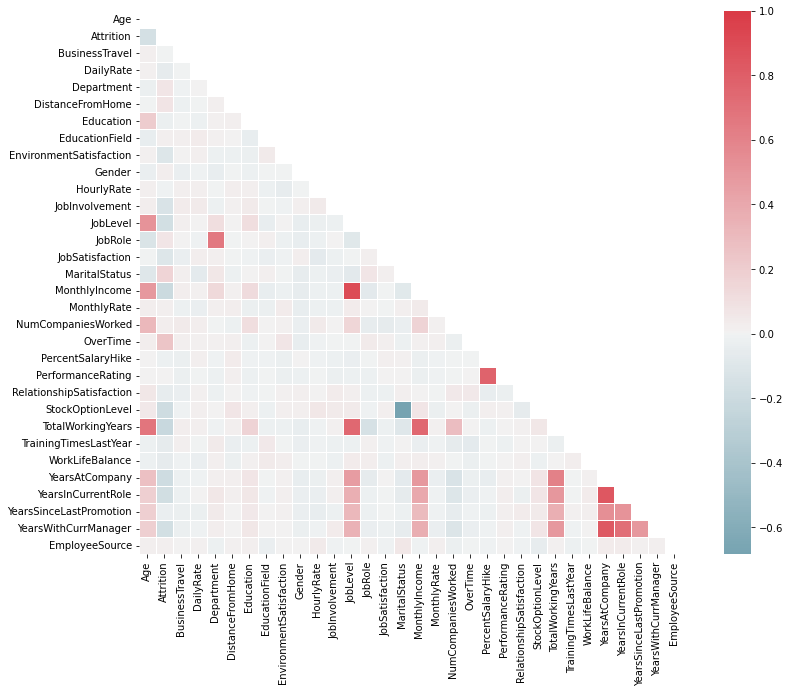

In [22]:

corr = hrdata.corr()
# Generate a mask for the upper triangle
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(15, 10))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(220, 10, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
heatmap = sns.heatmap(corr, mask=mask, cmap=cmap, center=0.0,
                      vmax = 1, square=True, linewidths=.5, ax=ax)
#plt.savefig('corr-heat.png')
plt.show()

There is a high correlation between monthly income and job level and between Percent salary hike and performance rating.



Years at company, years in current role, years since last promotion, years with current manager, total working years, monthly income and job level are also correlated.


In [23]:
#pip install hvplot

In [24]:
#Numerical correlation with Attrition 
import hvplot.pandas
hrdata.drop('Attrition', axis = 1).corrwith(hrdata.Attrition).sort_values().hvplot.barh(c = 'g', height = 500)


:Bars   [index]   (0)

Attrition has negative correlation with monthly income, total working years, Stock option Level, years at company, years in current role, years with current manager, job satisfactoin, job involvement, environment satisfaction and age.

Attrition has positive correlation with over time, marital status and distance from home.


# Modeling 

In [30]:
classifiers = {
    'GaussianNB' : GaussianNB(),
    'Logistic Regression' : LogisticRegression(C=0.01),
    'K Neighbors Classifier': KNeighborsClassifier(n_neighbors=5),
    'Support Vector Classifier': SVC(C=0.5, kernel='poly', probability=True),
    'Decision Tree Classifier': DecisionTreeClassifier(max_depth=4),
    'Random Forest Classifier': RandomForestClassifier(),
    'XGB Classifier': XGBClassifier(eval_metric = 'logloss'),
    'LGBM Classifier': LGBMClassifier(reg_alpha=0.1),
    'AdaBoost Classifier': AdaBoostClassifier(),
    'GradientBoosting Classifier': GradientBoostingClassifier(n_estimators=100, learning_rate=1.0,max_depth=1, random_state=0)
}

In [31]:
x = hrdata.drop('Attrition', axis = 1)
y = hrdata['Attrition']

In [32]:
import imblearn
from imblearn.over_sampling import SMOTE

In [33]:
from scipy import interp
from sklearn.metrics import roc_curve, auc, precision_recall_curve

C:\Users\mede1\Anaconda3\lib\site-packages\ipykernel_launcher.py:53: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead
C:\Users\mede1\Anaconda3\lib\site-packages\ipykernel_launcher.py:66: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead
C:\Users\mede1\Anaconda3\lib\site-packages\ipykernel_launcher.py:53: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead
C:\Users\mede1\Anaconda3\lib\site-packages\ipykernel_launcher.py:66: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead
C:\Users\mede1\Anaconda3\lib\site-packages\ipykernel_launcher.py:53: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead
C:\Users\mede1\Anaconda3\lib\site-packages\ipykernel_launcher.py:66: DeprecationWarning: scipy.interp is deprecated

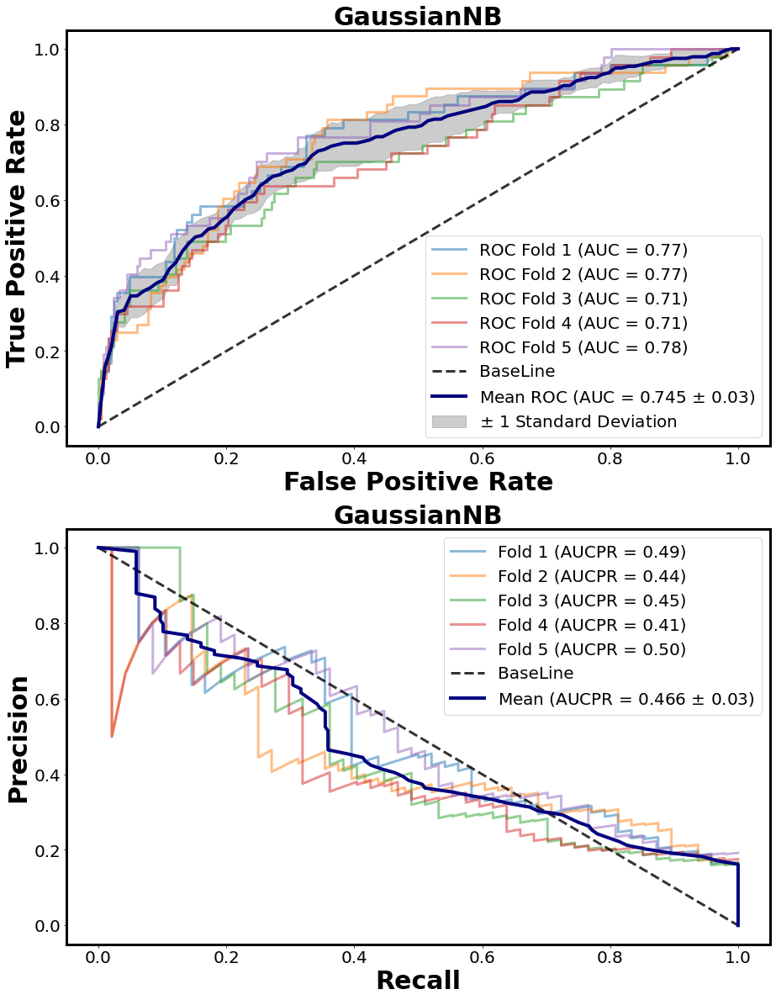

classification report for GaussianNB with imbalanced data:
                  0         1  accuracy macro avg weighted avg
precision  0.908047  0.437574  0.812925  0.672811     0.832233
recall     0.864583  0.544415  0.812925  0.704499     0.812925
f1-score   0.885686  0.484371  0.812925  0.685028     0.820988
support       246.6      47.4  0.812925     294.0        294.0

classification report for GaussianNB with oversampled data:
                  0         1 accuracy macro avg weighted avg
precision  0.919337  0.306665  0.69932  0.613001     0.820578
recall     0.703183  0.679255  0.69932  0.691219      0.69932
f1-score   0.796637  0.422163  0.69932    0.6094     0.736273
support       246.6      47.4  0.69932     294.0        294.0



C:\Users\mede1\Anaconda3\lib\site-packages\ipykernel_launcher.py:53: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead
C:\Users\mede1\Anaconda3\lib\site-packages\ipykernel_launcher.py:66: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead
C:\Users\mede1\Anaconda3\lib\site-packages\ipykernel_launcher.py:53: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead
C:\Users\mede1\Anaconda3\lib\site-packages\ipykernel_launcher.py:66: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead
C:\Users\mede1\Anaconda3\lib\site-packages\ipykernel_launcher.py:53: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead
C:\Users\mede1\Anaconda3\lib\site-packages\ipykernel_launcher.py:66: DeprecationWarning: scipy.interp is deprecated

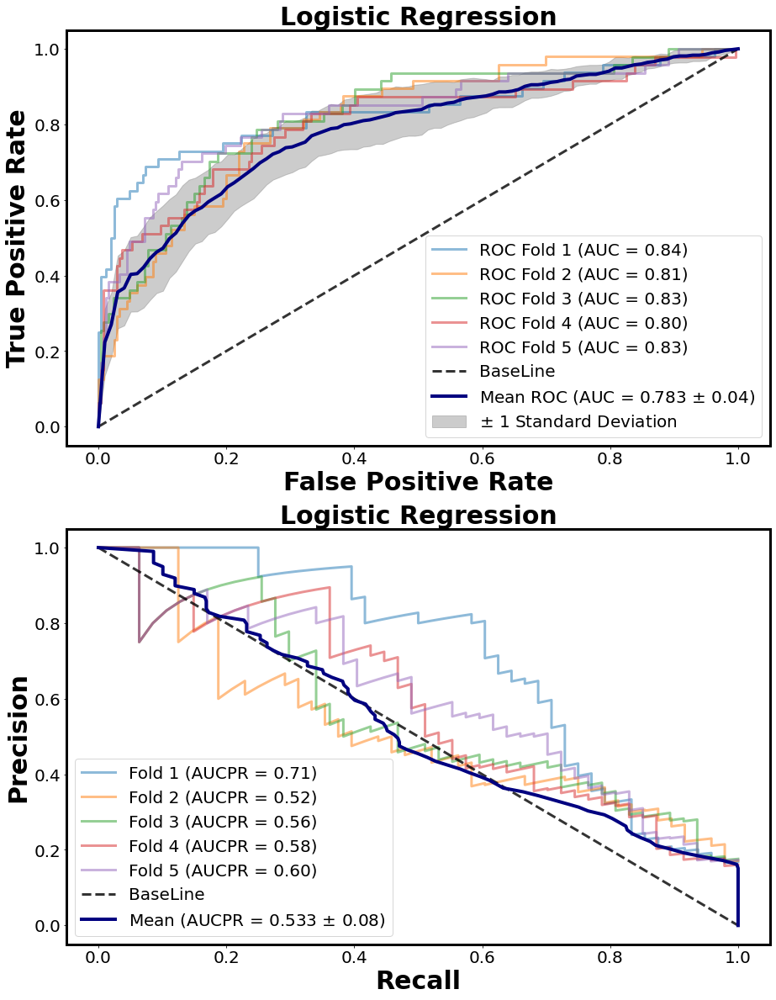

classification report for Logistic Regression with imbalanced data:
                  0         1  accuracy macro avg weighted avg
precision  0.856991  0.856818  0.857143  0.856904      0.85705
recall     0.995948  0.135195  0.857143  0.565572     0.857143
f1-score   0.921244  0.231545  0.857143  0.576394     0.810012
support       246.6      47.4  0.857143     294.0        294.0

classification report for Logistic Regression with oversampled data:
                  0         1  accuracy macro avg weighted avg
precision  0.937238  0.383535  0.766667  0.660386     0.847995
recall     0.773753  0.730142  0.766667  0.751948     0.766667
f1-score   0.847524  0.502386  0.766667  0.674955     0.791878
support       246.6      47.4  0.766667     294.0        294.0



C:\Users\mede1\Anaconda3\lib\site-packages\ipykernel_launcher.py:53: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead
C:\Users\mede1\Anaconda3\lib\site-packages\ipykernel_launcher.py:66: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead
C:\Users\mede1\Anaconda3\lib\site-packages\ipykernel_launcher.py:53: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead
C:\Users\mede1\Anaconda3\lib\site-packages\ipykernel_launcher.py:66: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead
C:\Users\mede1\Anaconda3\lib\site-packages\ipykernel_launcher.py:53: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead
C:\Users\mede1\Anaconda3\lib\site-packages\ipykernel_launcher.py:66: DeprecationWarning: scipy.interp is deprecated

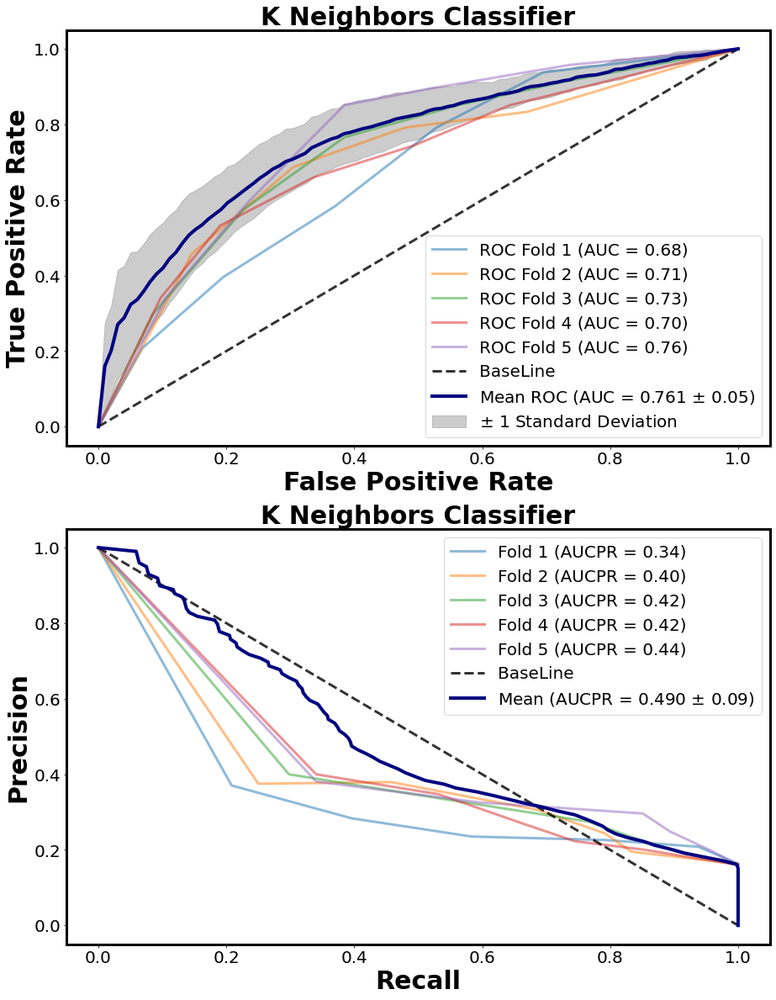

classification report for K Neighbors Classifier with imbalanced data:
                  0         1 accuracy macro avg weighted avg
precision  0.855788  0.672273  0.84898  0.764031     0.826286
recall     0.986222  0.135284  0.84898  0.560753      0.84898
f1-score   0.916352  0.221949  0.84898  0.569151     0.804344
support       246.6      47.4  0.84898     294.0        294.0

classification report for K Neighbors Classifier with oversampled data:
                  0         1  accuracy macro avg weighted avg
precision  0.920934  0.276777  0.654422  0.598856     0.817097
recall     0.643988  0.709486  0.654422  0.676737     0.654422
f1-score   0.757278  0.397511  0.654422  0.577394     0.699241
support       246.6      47.4  0.654422     294.0        294.0



C:\Users\mede1\Anaconda3\lib\site-packages\ipykernel_launcher.py:53: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead
C:\Users\mede1\Anaconda3\lib\site-packages\ipykernel_launcher.py:66: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead
C:\Users\mede1\Anaconda3\lib\site-packages\ipykernel_launcher.py:53: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead
C:\Users\mede1\Anaconda3\lib\site-packages\ipykernel_launcher.py:66: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead
C:\Users\mede1\Anaconda3\lib\site-packages\ipykernel_launcher.py:53: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead
C:\Users\mede1\Anaconda3\lib\site-packages\ipykernel_launcher.py:66: DeprecationWarning: scipy.interp is deprecated

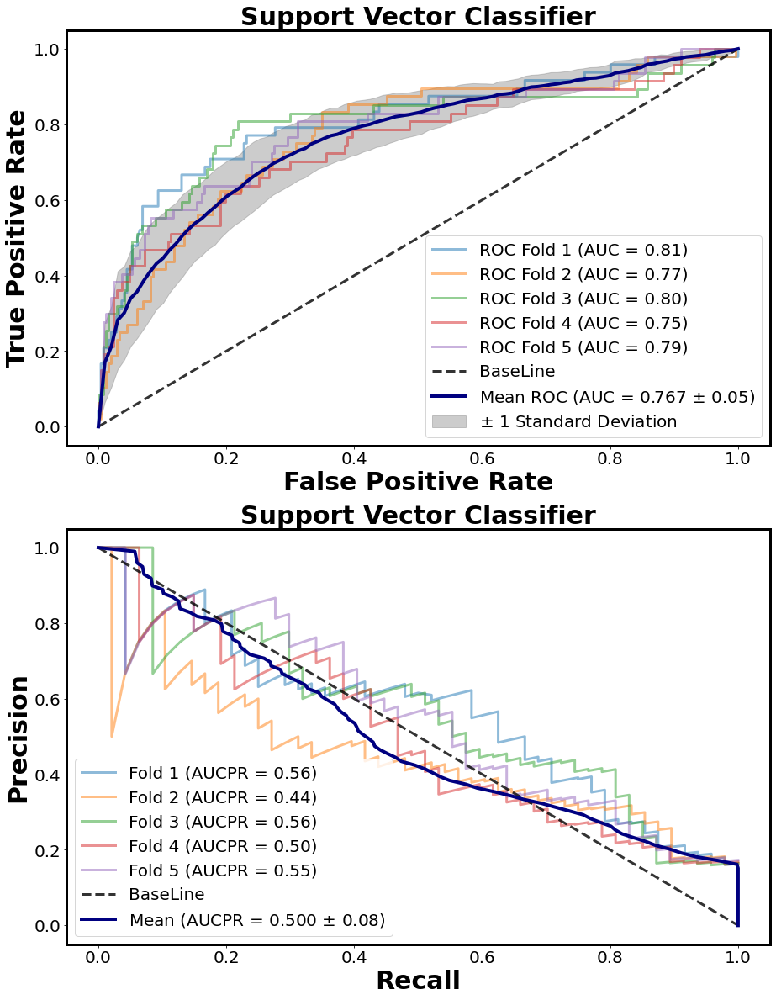

classification report for Support Vector Classifier with imbalanced data:
                  0         1  accuracy macro avg weighted avg
precision  0.855991  0.894444  0.857143  0.875218     0.862173
recall     0.997568  0.126862  0.857143  0.562215     0.857143
f1-score   0.921359  0.220582  0.857143   0.57097     0.808311
support       246.6      47.4  0.857143     294.0        294.0

classification report for Support Vector Classifier with oversampled data:
                  0         1  accuracy macro avg weighted avg
precision  0.902027   0.52112  0.844898  0.711574     0.840664
recall     0.914874   0.48156  0.844898  0.698217     0.844898
f1-score   0.908198  0.496736  0.844898  0.702467     0.841818
support       246.6      47.4  0.844898     294.0        294.0



C:\Users\mede1\Anaconda3\lib\site-packages\ipykernel_launcher.py:53: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead
C:\Users\mede1\Anaconda3\lib\site-packages\ipykernel_launcher.py:66: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead
C:\Users\mede1\Anaconda3\lib\site-packages\ipykernel_launcher.py:53: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead
C:\Users\mede1\Anaconda3\lib\site-packages\ipykernel_launcher.py:66: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead
C:\Users\mede1\Anaconda3\lib\site-packages\ipykernel_launcher.py:53: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead
C:\Users\mede1\Anaconda3\lib\site-packages\ipykernel_launcher.py:66: DeprecationWarning: scipy.interp is deprecated

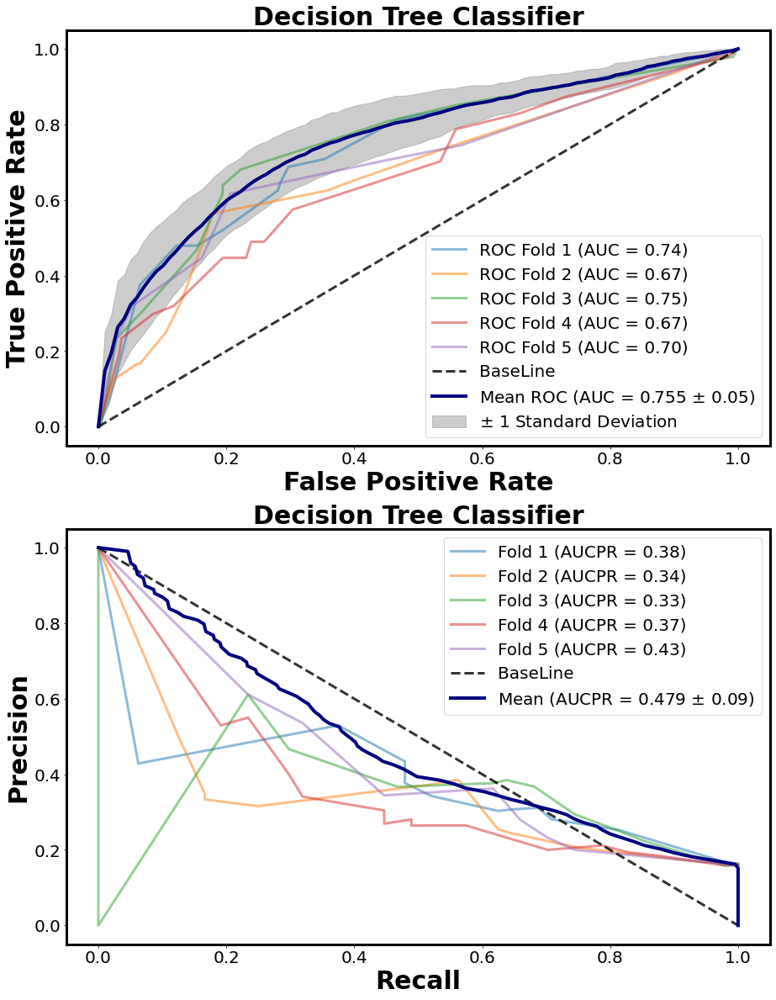

classification report for Decision Tree Classifier with imbalanced data:
                  0         1  accuracy macro avg weighted avg
precision  0.870116  0.519074  0.844898  0.694595     0.813481
recall     0.958655  0.253812  0.844898  0.606234     0.844898
f1-score   0.912072  0.333891  0.844898  0.622982     0.818741
support       246.6      47.4  0.844898     294.0        294.0

classification report for Decision Tree Classifier with oversampled data:
                  0         1  accuracy macro avg weighted avg
precision  0.897183  0.357381  0.770748  0.627282     0.810209
recall     0.821658  0.507181  0.770748   0.66442     0.770748
f1-score   0.856848  0.413961  0.770748  0.635404     0.785387
support       246.6      47.4  0.770748     294.0        294.0



C:\Users\mede1\Anaconda3\lib\site-packages\ipykernel_launcher.py:53: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead
C:\Users\mede1\Anaconda3\lib\site-packages\ipykernel_launcher.py:66: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead
C:\Users\mede1\Anaconda3\lib\site-packages\ipykernel_launcher.py:53: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead
C:\Users\mede1\Anaconda3\lib\site-packages\ipykernel_launcher.py:66: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead
C:\Users\mede1\Anaconda3\lib\site-packages\ipykernel_launcher.py:53: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead
C:\Users\mede1\Anaconda3\lib\site-packages\ipykernel_launcher.py:66: DeprecationWarning: scipy.interp is deprecated

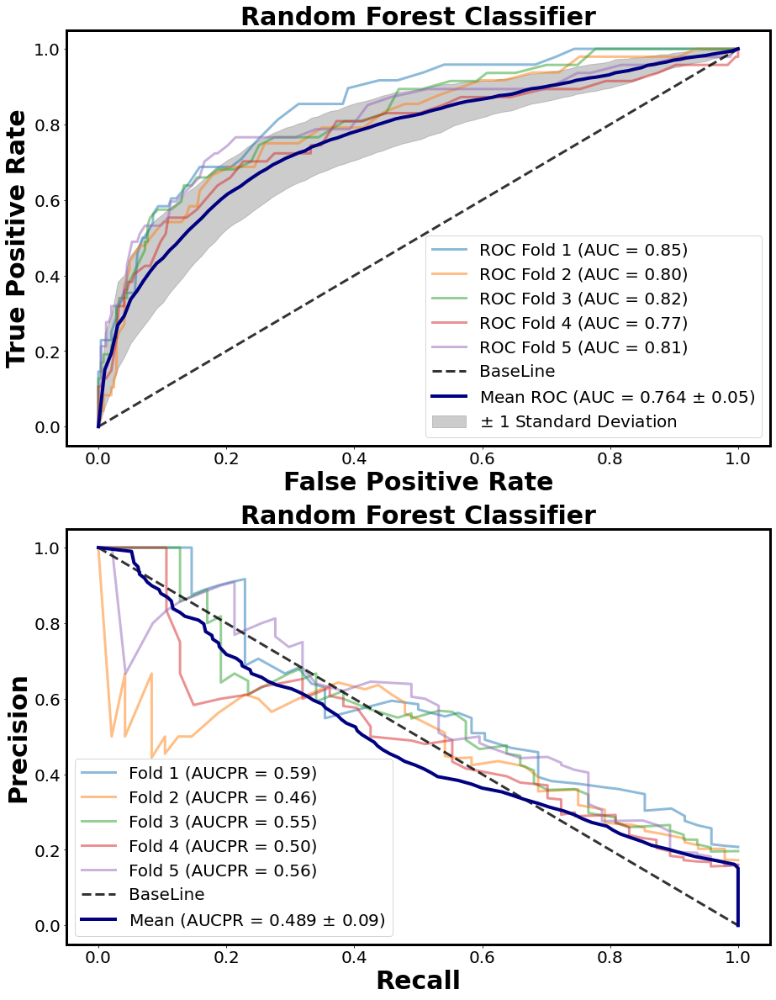

classification report for Random Forest Classifier with imbalanced data:
                  0         1  accuracy macro avg weighted avg
precision  0.860094  0.794936  0.857823  0.827515      0.84971
recall     0.991896  0.160372  0.857823  0.576134     0.857823
f1-score   0.921288  0.265016  0.857823  0.593152     0.815481
support       246.6      47.4  0.857823     294.0        294.0

classification report for Random Forest Classifier with oversampled data:
                  0         1  accuracy macro avg weighted avg
precision  0.876738    0.6878  0.863265  0.782269     0.846304
recall     0.974056  0.287411  0.863265  0.630734     0.863265
f1-score   0.922781   0.40179  0.863265  0.662286      0.83871
support       246.6      47.4  0.863265     294.0        294.0



C:\Users\mede1\Anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
C:\Users\mede1\Anaconda3\lib\site-packages\xgboost\data.py:114: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  "because it will generate extra copies and increase " +
C:\Users\mede1\Anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBCla

C:\Users\mede1\Anaconda3\lib\site-packages\xgboost\data.py:114: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  "because it will generate extra copies and increase " +
C:\Users\mede1\Anaconda3\lib\site-packages\ipykernel_launcher.py:53: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead
C:\Users\mede1\Anaconda3\lib\site-packages\ipykernel_launcher.py:66: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


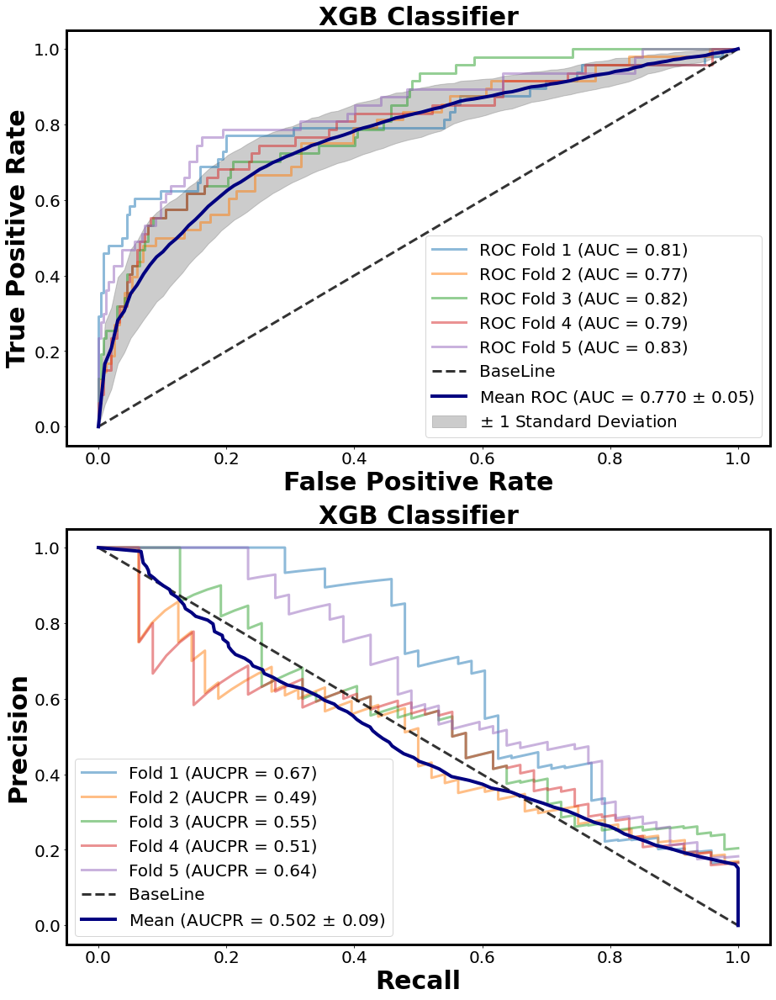

classification report for XGB Classifier with imbalanced data:
                  0         1  accuracy macro avg weighted avg
precision   0.88493  0.723418  0.870748  0.804174     0.858975
recall     0.972433  0.341933  0.870748  0.657183     0.870748
f1-score   0.926556  0.459587  0.870748  0.693071     0.851254
support       246.6      47.4  0.870748     294.0        294.0

classification report for XGB Classifier with oversampled data:
                  0         1  accuracy macro avg weighted avg
precision  0.890279   0.70569  0.872109  0.797985     0.860598
recall     0.966765  0.379965  0.872109  0.673365     0.872109
f1-score   0.926846   0.48936  0.872109  0.708103       0.8563
support       246.6      47.4  0.872109     294.0        294.0



C:\Users\mede1\Anaconda3\lib\site-packages\ipykernel_launcher.py:53: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead
C:\Users\mede1\Anaconda3\lib\site-packages\ipykernel_launcher.py:66: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead
C:\Users\mede1\Anaconda3\lib\site-packages\ipykernel_launcher.py:53: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead
C:\Users\mede1\Anaconda3\lib\site-packages\ipykernel_launcher.py:66: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead
C:\Users\mede1\Anaconda3\lib\site-packages\ipykernel_launcher.py:53: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead
C:\Users\mede1\Anaconda3\lib\site-packages\ipykernel_launcher.py:66: DeprecationWarning: scipy.interp is deprecated

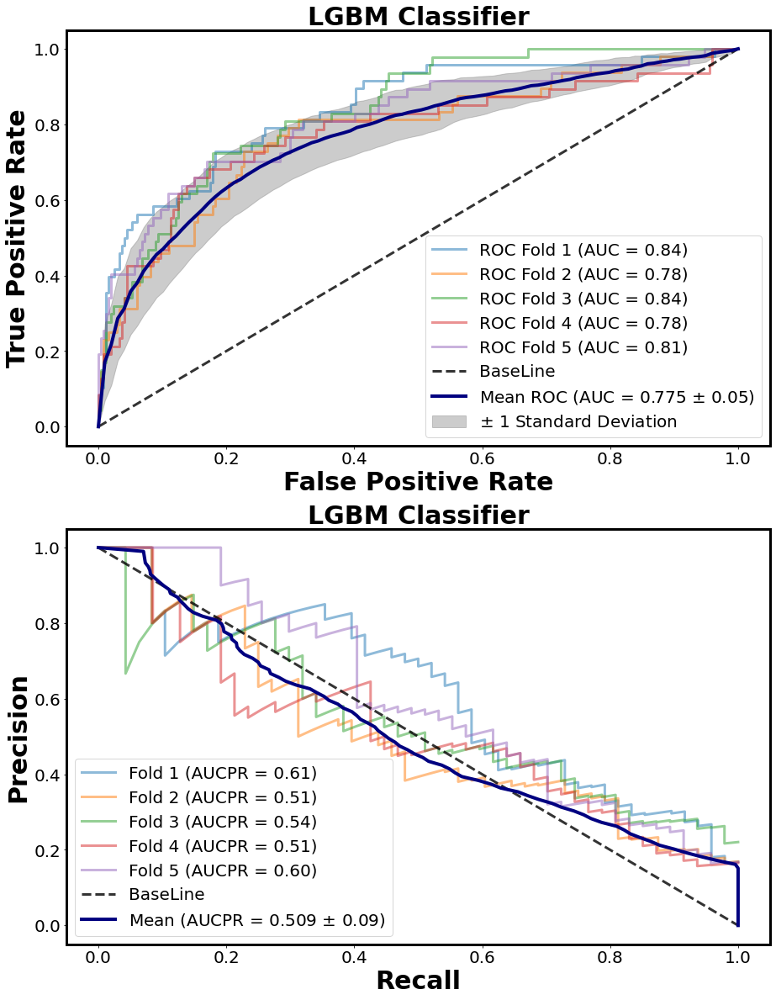

classification report for LGBM Classifier with imbalanced data:
                  0         1  accuracy macro avg weighted avg
precision  0.877471   0.70613  0.864626  0.791801     0.849916
recall     0.974872  0.291489  0.864626  0.633181     0.864626
f1-score   0.923526   0.40798  0.864626  0.665753     0.840362
support       246.6      47.4  0.864626     294.0        294.0

classification report for LGBM Classifier with oversampled data:
                  0         1  accuracy macro avg weighted avg
precision  0.885263   0.69179  0.868707  0.788526     0.854154
recall     0.969198  0.346365  0.868707  0.657782     0.868707
f1-score   0.925271  0.458511  0.868707  0.691891     0.849978
support       246.6      47.4  0.868707     294.0        294.0



C:\Users\mede1\Anaconda3\lib\site-packages\ipykernel_launcher.py:53: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead
C:\Users\mede1\Anaconda3\lib\site-packages\ipykernel_launcher.py:66: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead
C:\Users\mede1\Anaconda3\lib\site-packages\ipykernel_launcher.py:53: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead
C:\Users\mede1\Anaconda3\lib\site-packages\ipykernel_launcher.py:66: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead
C:\Users\mede1\Anaconda3\lib\site-packages\ipykernel_launcher.py:53: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead
C:\Users\mede1\Anaconda3\lib\site-packages\ipykernel_launcher.py:66: DeprecationWarning: scipy.interp is deprecated

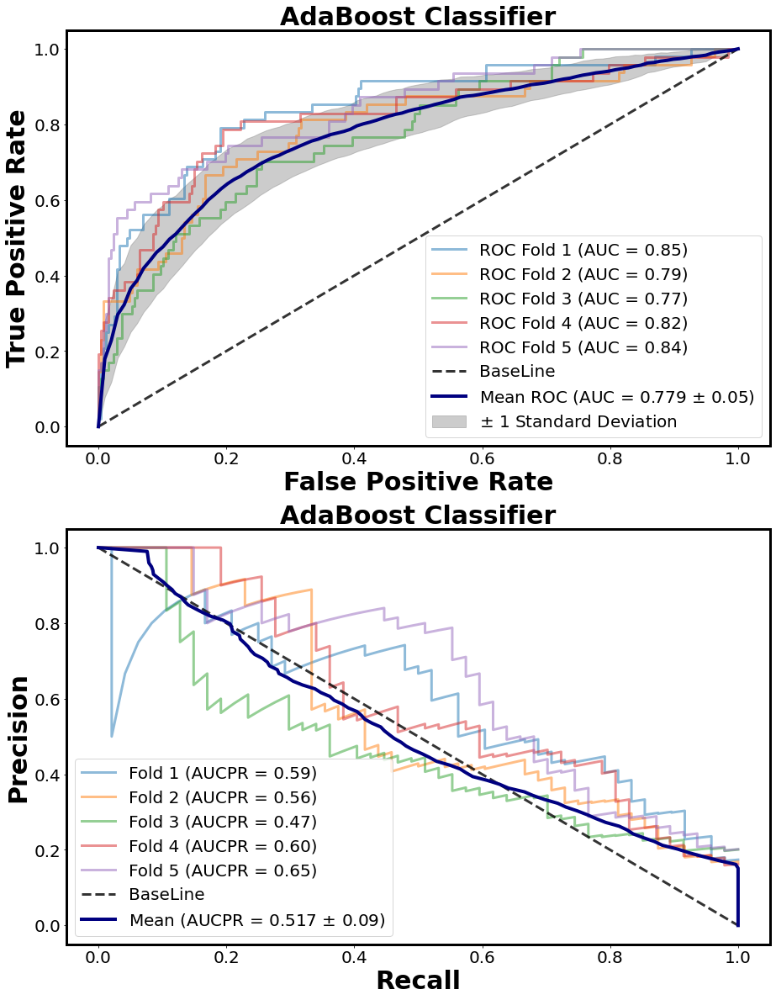

classification report for AdaBoost Classifier with imbalanced data:
                  0         1  accuracy macro avg weighted avg
precision  0.885959  0.692191  0.870068  0.789075     0.854772
recall     0.970001  0.350355  0.870068  0.660178     0.870068
f1-score   0.926061   0.46447  0.870068  0.695265      0.85163
support       246.6      47.4  0.870068     294.0        294.0

classification report for AdaBoost Classifier with oversampled data:
                  0         1 accuracy macro avg weighted avg
precision  0.908848  0.537137  0.84898  0.722992     0.848985
recall     0.911632   0.52367  0.84898  0.717651      0.84898
f1-score    0.91005  0.527189  0.84898   0.71862     0.848302
support       246.6      47.4  0.84898     294.0        294.0



C:\Users\mede1\Anaconda3\lib\site-packages\ipykernel_launcher.py:53: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead
C:\Users\mede1\Anaconda3\lib\site-packages\ipykernel_launcher.py:66: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead
C:\Users\mede1\Anaconda3\lib\site-packages\ipykernel_launcher.py:53: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead
C:\Users\mede1\Anaconda3\lib\site-packages\ipykernel_launcher.py:66: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead
C:\Users\mede1\Anaconda3\lib\site-packages\ipykernel_launcher.py:53: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead
C:\Users\mede1\Anaconda3\lib\site-packages\ipykernel_launcher.py:66: DeprecationWarning: scipy.interp is deprecated

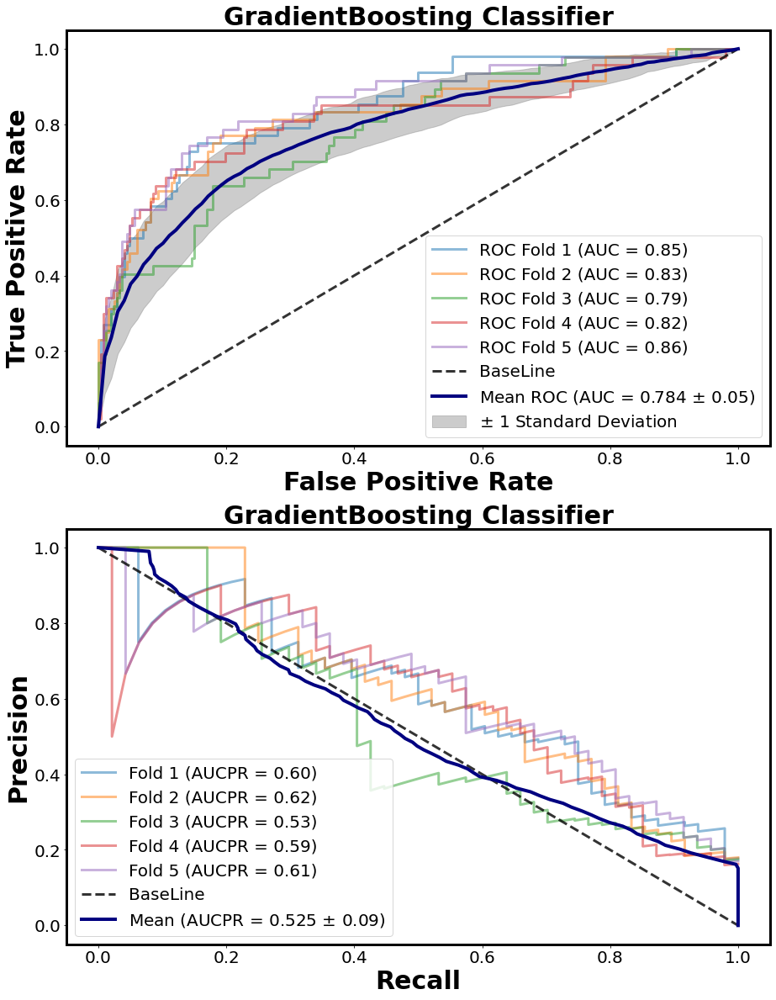

classification report for GradientBoosting Classifier with imbalanced data:
                  0         1 accuracy macro avg weighted avg
precision  0.898043   0.69082  0.87619  0.794431     0.864715
recall     0.961904  0.431028  0.87619  0.696466      0.87619
f1-score   0.928751  0.525486  0.87619  0.727118     0.863671
support       246.6      47.4  0.87619     294.0        294.0

classification report for GradientBoosting Classifier with oversampled data:
                  0         1  accuracy macro avg weighted avg
precision   0.90493  0.612604  0.865986  0.758767     0.857848
recall     0.939186  0.485461  0.865986  0.712323     0.865986
f1-score   0.921568  0.536731  0.865986  0.729149     0.859509
support       246.6      47.4  0.865986     294.0        294.0



In [34]:
mlp.rcParams['axes.linewidth'] = 3 
mlp.rcParams['lines.linewidth'] = 7

skf = StratifiedKFold(n_splits = 5, random_state = None, shuffle = False)
scaler = StandardScaler()
d1 = []

tprs = []
mean_fpr = np.linspace(0, 1, 100)
prs = []
aucs = []
aucs2 = []
mean_recall = np.linspace(0, 1, 100)


#indeces and columns for classification report
ind = ['precision', 'recall', 'f1-score', 'support']
cols = ['0', '1', 'accuracy','macro avg', 'weighted avg']

for name, clf in classifiers.items(): 
    #del d1,d2
    j = 0
    # fig, ax = plt.subplots(nrows=2, ncols=1, figsize=(20, 5))
    plt.figure(1,figsize=(15 , 20))
    #plt.figure(2,figsize=(18 , 13))
    d1 = [] # a list to collect the classification report of imbalanced data
    d2 = [] # a list to collect the classification report of oversampled data
    for train_ind, valid_ind in skf.split(x, y):
        
        x.iloc[train_ind] = scaler.fit_transform(x.iloc[train_ind])
        x.iloc[valid_ind] = scaler.transform(x.iloc[valid_ind])
        
        clf.fit(x.iloc[train_ind], y.iloc[train_ind])
        y_train_pred = clf.predict(x.iloc[train_ind])
        y_valid_pred = clf.predict(x.iloc[valid_ind])
        
        
        
        #resamples only minority class
        x_oversampled, y_oversampled = SMOTE(
            sampling_strategy = 'minority', random_state = 34).fit_resample(x.iloc[train_ind], y.iloc[train_ind])
        #clf.fit(x_oversampled, y_oversampled)
        probas_ = clf.fit(x_oversampled, y_oversampled).predict_proba(x.iloc[valid_ind])
        y_valid_pred_oversampled = clf.predict(x.iloc[valid_ind])
        
        
        # Use the probabilities for your ROC and Precision-recall curves
        #y_valid_pred_oversampled_proba = clf.predict_proba(x.iloc[valid_ind])
        
        #AUC CURVES AND SCORE 
        mean_fpr = np.linspace(0, 1, 100)
        fpr, tpr, thresholds = roc_curve(y.iloc[valid_ind],  probas_[:, 1])
        tprs.append(interp(mean_fpr, fpr, tpr))
        tprs[-1][0] = 0.0
        roc_auc = auc(fpr, tpr)
        aucs.append(roc_auc)
        plt.subplot(211)
        plt.plot(fpr, tpr, lw=3, alpha=0.5, 
                 label='ROC Fold %d (AUC = %0.2f)' % (j+1, roc_auc))
        
        #j+=1
        
        #PRECISION RECALL CURVES 
        
        precision, recall, thresholds = precision_recall_curve(y.iloc[valid_ind], probas_[:, 1])
        prs.append(interp(mean_recall, precision, recall))
        pr_auc = auc(recall, precision)
        aucs2.append(pr_auc)
        plt.subplot(212)
        plt.plot(recall, precision, lw=3, alpha=0.5, label='Fold %d (AUCPR = %0.2f)' % (j+1, pr_auc))
        
        j+=1
        
        
        
        
        d3 = classification_report(y.iloc[valid_ind], y_valid_pred, output_dict = True)
        d4 = classification_report(y.iloc[valid_ind], y_valid_pred_oversampled, output_dict = True)
        
        d1.append(d3)
        d2.append(d4)
    
    
    
    
    plt.subplot(211)
    plt.plot([0, 1], [0, 1], linestyle='--', lw=3, color='k',label='BaseLine', alpha=.8)
    mean_tpr = np.mean(tprs, axis=0)
    mean_tpr[-1] = 1.0
    mean_auc = auc(mean_fpr, mean_tpr)
    std_auc = np.std(aucs)
    plt.plot(mean_fpr, mean_tpr, color='navy', label=r'Mean ROC (AUC = %0.3f $\pm$ %0.2f)' % (mean_auc, std_auc), lw=4)
    std_tpr = np.std(tprs, axis=0)
    tprs_upper = np.minimum(mean_tpr + std_tpr, 1)
    tprs_lower = np.maximum(mean_tpr - std_tpr, 0)
    
    plt.fill_between(mean_fpr, tprs_lower, tprs_upper, color='grey', alpha=.4, label=r'$\pm$ 1 Standard Deviation')
    plt.xlim([-0.05, 1.05])
    plt.ylim([-0.05, 1.05])
    #plt.subplot(211)
    plt.xlabel('False Positive Rate' ,  fontweight = "bold" , fontsize=30)
    plt.ylabel('True Positive Rate',fontweight = "bold" , fontsize=30)
    plt.tick_params(axis='both', which='major', labelsize=20)
    plt.legend( prop={'size':20} , loc = 4)
    plt.title(label = name,  fontweight = "bold" , fontsize=30)
    
    
    #PRECISION RECALL CURVES 
    plt.subplot(212)
    plt.plot([0, 1], [1, 0], linestyle='--', lw=3, color='k', label='BaseLine', alpha=.8)
    mean_precision = np.mean(prs, axis=0)
    mean_auc = auc(mean_recall, mean_precision)
    std_auc = np.std(aucs2)
    plt.subplot(212)
    plt.plot(mean_precision, mean_recall, color='navy', label=r'Mean (AUCPR = %0.3f $\pm$ %0.2f)' % (mean_auc, std_auc), lw=4)
    

    plt.xlim([-0.05, 1.05])
    plt.ylim([-0.05, 1.05])
    plt.xlabel('Recall' ,  fontweight = "bold" , fontsize=30)
    plt.ylabel('Precision',fontweight = "bold" , fontsize=30)
    plt.tick_params(axis='both', which='major', labelsize=20)
    plt.legend( prop={'size':20} , loc = 0)
    plt.title(label = name,  fontweight = "bold" , fontsize=30)
    plt.show() 
    
    temp_df_1 = pd.DataFrame(d1, columns = cols) #Dataframe containing the classification report for all 5-folds for imbalanced data
    temp_df_2 = pd.DataFrame(d2, columns = cols) #Dataframe containing the classification report for all 5-folds for oversampled data
    
    #del report_1, report_2
    report_1 = pd.DataFrame(index = ind, columns = cols) #classification report for imbalanced data
    report_2 = pd.DataFrame(index = ind, columns = cols) #classification report for oversampled data

    for index in ind:
        for col in temp_df_1:
            #del g1, g2
            g1 = [] #containing the values for each index(accuracy, precision, etc) in 5-folds for a speicific col in imbalanced data
            g2 = [] #containing the values for each index(accuracy, precision, etc) in 5-folds for a speicific col in oversampled data
            
            if col == 'accuracy':
                report_1.loc[index,col] = np.mean(temp_df_1[col])
                report_2.loc[index,col] = np.mean(temp_df_2[col])
                continue

            g1.append(temp_df_1[col].apply(lambda x: x[index])) #exctracting the data for each index (accuracy, precison, etc)
            g2.append(temp_df_2[col].apply(lambda x: x[index]))
            
            report_1.loc[index,col] = np.mean(g1) #Taking the mean for 5-folds
            report_2.loc[index,col] = np.mean(g2)
        
    print('classification report for', name, 'with imbalanced data:' )
    print(report_1)
    print('')
    print('classification report for', name, 'with oversampled data:' )
    print(report_2)
    print('')
    print('===============================================================')
  


Since it is a very imbalanced data , AUROC (AUC) and AUCPR will be used to analyse the performance of these classification. As we can see Logistic regression shows the best AUCPR and AUCROC scores followed by GBT and Adaboost considering the AUCPR score.

# Analysis using  the last fold of split and test 

In [35]:
x_train = x_oversampled
y_train = y_oversampled
print('x_imbalanced shape:', x.iloc[train_ind].shape)
print('x_oversampled shape:', x_oversampled.shape)
print('x_train', x_train.shape)
print('y_train', y_train.shape)
print('y_test', y.iloc[valid_ind].shape)
print('x_test', x.iloc[valid_ind].shape)
x_test = x.iloc[valid_ind]
y_test = y.iloc[valid_ind]
#ada_clf = AdaBoostClassifier()
#ada_clf.fit(x_oversampled, y_oversampled)~
#y_test_pred = ada_clf.predict(x_test)


x_imbalanced shape: (1176, 31)
x_oversampled shape: (1972, 31)
x_train (1972, 31)
y_train (1972,)
y_test (294,)
x_test (294, 31)


In [36]:
#x_train.head()

In [37]:
#y_train.head()

GaussianNB
[[174  73]
 [ 13  34]]
Logistic Regression
[[192  55]
 [ 11  36]]
K Neighbors Classifier
[[152  95]
 [  7  40]]
Support Vector Classifier
[[226  21]
 [ 21  26]]
Decision Tree Classifier
[[196  51]
 [ 18  29]]
Random Forest Classifier
[[242   5]
 [ 32  15]]
XGB Classifier
[[243   4]
 [ 30  17]]


C:\Users\mede1\Anaconda3\lib\site-packages\xgboost\data.py:114: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  "because it will generate extra copies and increase " +


LGBM Classifier
[[240   7]
 [ 28  19]]
AdaBoost Classifier
[[227  20]
 [ 18  29]]
GradientBoosting Classifier
[[235  12]
 [ 22  25]]


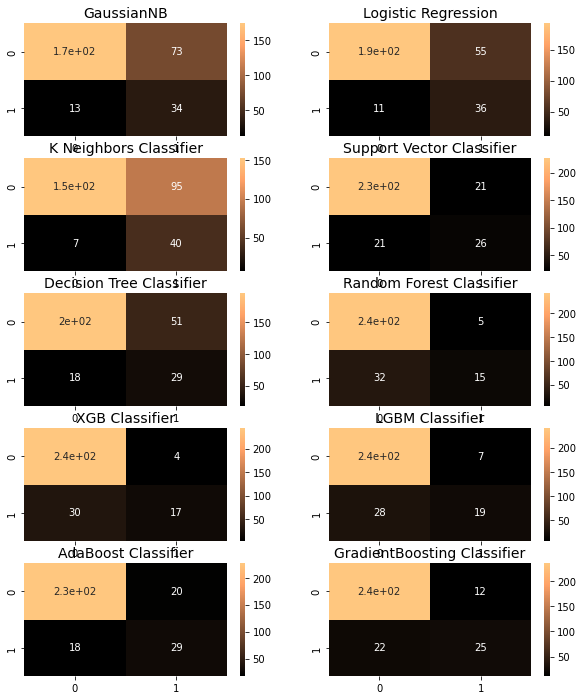

In [38]:
fig, ax = plt.subplots(5,2, figsize = (10,12)) 
i = 0
for name, clf in classifiers.items():
    y_predict = clf.predict(x_test)
    print(name)
    print(confusion_matrix(y_test, y_predict))
    sns.heatmap(confusion_matrix(y_test, y_predict), ax = ax[i//2, (i)%2], annot=True, cmap=plt.cm.copper)
    ax[i//2, (i)%2].set_title(name ,  fontsize=14)

    
#auc_score[name] = np.round(roc_auc_score(y_test, y_test_pred),3)
#    PrecisionRecallDisplay.from_estimator(clf, x_test, y_test, ax = ax[i//2, (i)%2])
    i += 1 
    

Between True positive and True negatives, LR shows good results followed by GaussianNB.

# Hyperparameters for all classifiers 

In [39]:
hyperparameters = {
    'Logistic Regression':{
                            'penalty': ['l1', 'l2'], 'C':[0.01, 0.1, 1] 
                            }, #l1 referst to lasso regression and l2 to Ridge regression, C is the inverse of (lambda, strength of regularization)
    'K Neighbors Classifier':{
                            'algorithm':['auto', 'ball_tree', 'kd_tree', 'brute'], 'n_neighbors': list(range(3,8,1))
                              },#‘auto’ will attempt to decide the most appropriate algorithm based on the values passed to fit method.
    'Support Vector Classifier':{
           'C': [0.01, 0.1, 0.5], 'kernel': ['rbf', 'linear', 'poly','sigmoid']
            #C is the inverse of (lambda, strength of regularization), higher C means higher trust in training set as if it is representative for the all data
            #The default kernel to run the algorithm of SVC(support vector classification) is rbf
    },
    'Decision Tree Classifier':{
                                'criterion': ['gini', 'entropy'], 'max_depth': list(range(2,5,1))
                                #Criterion is the function to measure the quality of a split. Supported criteria are “gini” for the Gini impurity and “entropy” for the information gain
                                },
    'LGBM Classifier':{
                        'boosting_type': ['gbdt', 'dart', 'goss', 'rf' ], 'reg_alpha':[0.0, 0.01, 0.1]  , 'reg_lambda':[0.0, 0.01, 0.1] 
                       },
    'AdaBoost Classifier':{
                        'algorithm': ['SAMME', 'SAMME.R' ], 'learning_rate':[1.0, 0.01, 0.1]
                       },
                                
                                }    
    

In [40]:
%%time

cv = StratifiedKFold(n_splits = 5, shuffle = True, random_state = 34)
clfs = []

for clf, hyperparam in hyperparameters.items():
    estimator = classifiers.get(clf)
    grid = GridSearchCV(estimator, hyperparam, cv = cv)
    grid.fit(x_train, y_train)
    best_hyperparams = grid.best_params_
    clfs.append(grid.best_estimator_)
    print('The best hyperparameters for', clf, ':', best_hyperparams, 'with r2 score: %0.1f' %(grid.best_score_))

C:\Users\mede1\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:619: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\mede1\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mede1\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "C:\Users\mede1\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py", line 444, in _check_solver
    "got %s penalty." % (solver, penalty))
ValueError: Solver lbfgs supports only 'l2' or 'none' penalties, got l1 penalty.

  FitFailedWarning)
C:\Users\mede1\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:619: FitFailedWarning: Estimator fit failed. The score on this trai

C:\Users\mede1\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:925: UserWarning: One or more of the test scores are non-finite: [       nan 0.79716636        nan 0.79006747        nan 0.78550665]
  category=UserWarning


The best hyperparameters for Logistic Regression : {'C': 0.01, 'penalty': 'l2'} with r2 score: 0.8
The best hyperparameters for K Neighbors Classifier : {'algorithm': 'auto', 'n_neighbors': 4} with r2 score: 0.9
The best hyperparameters for Support Vector Classifier : {'C': 0.5, 'kernel': 'poly'} with r2 score: 0.9
The best hyperparameters for Decision Tree Classifier : {'criterion': 'gini', 'max_depth': 4} with r2 score: 0.8


C:\Users\mede1\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:619: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\mede1\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mede1\Anaconda3\lib\site-packages\lightgbm\sklearn.py", line 972, in fit
    callbacks=callbacks, init_model=init_model)
  File "C:\Users\mede1\Anaconda3\lib\site-packages\lightgbm\sklearn.py", line 758, in fit
    callbacks=callbacks
  File "C:\Users\mede1\Anaconda3\lib\site-packages\lightgbm\engine.py", line 272, in train
    booster = Booster(params=params, train_set=train_set)
  File "C:\Users\mede1\Anaconda3\lib\site-packages\lightgbm\basic.py", line 2613, in __init__
    ctypes.byref(self.handle)))
  File "C:\Users\mede1\Anaconda3\lib\site-packages\

C:\Users\mede1\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:619: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\mede1\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mede1\Anaconda3\lib\site-packages\lightgbm\sklearn.py", line 972, in fit
    callbacks=callbacks, init_model=init_model)
  File "C:\Users\mede1\Anaconda3\lib\site-packages\lightgbm\sklearn.py", line 758, in fit
    callbacks=callbacks
  File "C:\Users\mede1\Anaconda3\lib\site-packages\lightgbm\engine.py", line 272, in train
    booster = Booster(params=params, train_set=train_set)
  File "C:\Users\mede1\Anaconda3\lib\site-packages\lightgbm\basic.py", line 2613, in __init__
    ctypes.byref(self.handle)))
  File "C:\Users\mede1\Anaconda3\lib\site-packages\

C:\Users\mede1\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:619: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\mede1\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mede1\Anaconda3\lib\site-packages\lightgbm\sklearn.py", line 972, in fit
    callbacks=callbacks, init_model=init_model)
  File "C:\Users\mede1\Anaconda3\lib\site-packages\lightgbm\sklearn.py", line 758, in fit
    callbacks=callbacks
  File "C:\Users\mede1\Anaconda3\lib\site-packages\lightgbm\engine.py", line 272, in train
    booster = Booster(params=params, train_set=train_set)
  File "C:\Users\mede1\Anaconda3\lib\site-packages\lightgbm\basic.py", line 2613, in __init__
    ctypes.byref(self.handle)))
  File "C:\Users\mede1\Anaconda3\lib\site-packages\

The best hyperparameters for LGBM Classifier : {'boosting_type': 'gbdt', 'reg_alpha': 0.1, 'reg_lambda': 0.0} with r2 score: 0.9
The best hyperparameters for AdaBoost Classifier : {'algorithm': 'SAMME.R', 'learning_rate': 1.0} with r2 score: 0.9
Wall time: 1min 9s


The hyperparameters were added afterwards to above classiifers, and their performace did improve

# Features improtance using Logistic regression 

Logistic regression showed good performance, hence, we will use the last fold for features importance. We adjusted the parameters again to have the best performance using the last fold test/train data.

In [41]:
lr_clf = LogisticRegression(C=0.1, penalty='l2')
lr_clf.fit(x_train, y_train)
#y_train_pred = lr_clf.predict(x_train)
y_test_pred = lr_clf.predict(x_test)

print(classification_report(y_test, y_test_pred))
print(confusion_matrix(y_test, y_test_pred))       

              precision    recall  f1-score   support

           0       0.95      0.79      0.86       247
           1       0.41      0.77      0.54        47

    accuracy                           0.79       294
   macro avg       0.68      0.78      0.70       294
weighted avg       0.86      0.79      0.81       294

[[196  51]
 [ 11  36]]


In [42]:

feature_names = x.columns
feature_names

Index(['Age', 'BusinessTravel', 'DailyRate', 'Department', 'DistanceFromHome',
       'Education', 'EducationField', 'EnvironmentSatisfaction', 'Gender',
       'HourlyRate', 'JobInvolvement', 'JobLevel', 'JobRole',
       'JobSatisfaction', 'MaritalStatus', 'MonthlyIncome', 'MonthlyRate',
       'NumCompaniesWorked', 'OverTime', 'PercentSalaryHike',
       'PerformanceRating', 'RelationshipSatisfaction', 'StockOptionLevel',
       'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance',
       'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager', 'EmployeeSource'],
      dtype='object')

In [43]:


w = np.zeros((30,))
w = lr_clf.coef_[0]

w


array([-0.12931852,  0.01355163, -0.14518159,  0.39577924,  0.24784132,
        0.04837647,  0.22794561, -0.57221207,  0.25586978, -0.04827972,
       -0.3815684 ,  0.10567706, -0.26726781, -0.34449839,  0.37949806,
       -0.54209614,  0.04830621,  0.38801911,  0.84307751, -0.30489439,
        0.03331952, -0.27513623, -0.34565394, -0.4245732 , -0.10700387,
       -0.2075507 ,  0.09389869, -0.19371899,  0.45223537, -0.17825131,
        0.07167525])

In [44]:

import math
feature_importance = pd.DataFrame(feature_names, columns = ["Features"])
feature_importance["Importance"] = pow(math.e, w)
feature_importance = feature_importance.sort_values(by = ["Importance"], ascending = False)
feature_importance[:10]



,Features,Importance
18,OverTime,2.323507
28,YearsSinceLastPromotion,1.571822
3,Department,1.485541
17,NumCompaniesWorked,1.474058
14,MaritalStatus,1.461551
8,Gender,1.291585
4,DistanceFromHome,1.281257
6,EducationField,1.256017
11,JobLevel,1.111463
26,YearsAtCompany,1.098448


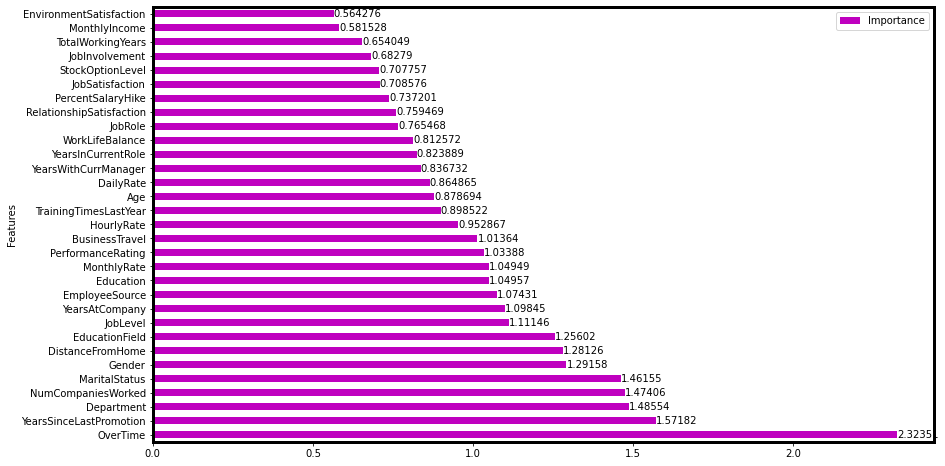

In [45]:
fig, ax = plt.subplots(figsize = (14,8))
feature_importance.plot.barh(x = 'Features', y = 'Importance' , ax = ax, color = 'm')
_ = ax.bar_label(ax.containers[0])
plt.show()


Overtime followed bu Years since last promotion and department are the most important features affecting employee attrition.

There is a difference between correlation and featurece importance ranking. Correlation is a statistical term which refers to how close two variables are, in terms of having a linear relationship with each other. Feature selection is one of the first, and arguably one of the most important steps, when performing any machine learning task. A feature in a dataset, is a column of data. When working with any dataset, we have to under stand which column (feature) is going to have a statistically significant impact on the output variable for more details check the following paper:







https://arxiv.org/abs/1310.5726 

# References


https://www.kaggle.com/oceands/hr-analytics-binary-classification-for-attrition


https://www.kaggle.com/dgokeeffe/ibm-hr-dataset-exploratory-data-analysis

https://www.kaggle.com/devendray/ibm-hr-data-visualization/notebook

https://www.kaggle.com/kelvintsemk/hr-descriptive/notebook

https://www.kaggle.com/dgokeeffe/ibm-hr-dataset-exploratory-data-analysis

outlier detection  

https://www.kaggle.com/nareshbhat/outlier-the-silent-killer/notebook

The Ultimate Guide to 12 Dimensionality Reduction Techniques (with Python codes)

https://www.analyticsvidhya.com/blog/2018/08/dimensionality-reduction-techniques-python/

Resampling strategies for imbalanced datasets

https://www.kaggle.com/rafjaa/resampling-strategies-for-imbalanced-datasets

Credit Fraud || Dealing with Imbalanced Datasets

https://www.kaggle.com/janiobachmann/credit-fraud-dealing-with-imbalanced-datasets

How to Use ROC Curves and Precision-Recall Curves for Classification in Python

https://machinelearningmastery.com/roc-curves-and-precision-recall-curves-for-classification-in-python/

Imbalanced data & why you should NOT use ROC curve

https://www.kaggle.com/lct14558/imbalanced-data-why-you-should-not-use-roc-curve

https://www.kaggle.com/ryanholbrook/deep-neural-networks

Regularization l2 (for more details about the equations)


https://github.com/pickus91/Logistic-Regression-Classifier-with-L2-Regularization

https://www.knime.com/blog/regularization-for-logistic-regression-l1-l2-gauss-or-laplace#:~:text=%E2%80%9CRegularization%20is%20any%20modification%20we,from%20overfitting%20the%20training%20dataset.

https://machinelearningmastery.com/calculate-feature-importance-with-python/

Test cross-validation ROC and precision recall curves

https://amirhessam88.github.io/roc-vs-pr/

Difference between correlation and Featurece importance ranking 

https://stackoverflow.com/questions/61037114/random-forest-feature-importances-vs-correlation-matrix#:~:text=Correlation%20is%20a%20statistical%20term,is%20a%20column%20of%20data.

https://vishalramesh.substack.com/p/feature-selection-correlation-and-p-value-da8921bfb3cf